In [ ]:
#Install LIME and SHAP
!pip install lime
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 792.4 kB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=979ab654ac3517d87462a0b259d4b633cc90013de27743b927aee5140294d80e
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 533.5/533.5 kB 8.1 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
import lime
from lime import lime_tabular
import shap
import matplotlib.pyplot as plt

In [ ]:
# Load the dataset
data = pd.read_csv('/content/drive/MyDrive/CSE 710 Datasets/Early_stage_diabetes_data_upload.csv')

In [ ]:
# Inspect data
data

,Age,Gender,Polyuria,Polydipsia,sudden weight loss,weakness,Polyphagia,Genital thrush,visual blurring,Itching,Irritability,delayed healing,partial paresis,muscle stiffness,Alopecia,Obesity,class
0,40,Male,No,Yes,No,Yes,No,No,No,Yes,No,Yes,No,Yes,Yes,Yes,Positive
1,58,Male,No,No,No,Yes,No,No,Yes,No,No,No,Yes,No,Yes,No,Positive
2,41,Male,Yes,No,No,Yes,Yes,No,No,Yes,No,Yes,No,Yes,Yes,No,Positive
3,45,Male,No,No,Yes,Yes,Yes,Yes,No,Yes,No,Yes,No,No,No,No,Positive
4,60,Male,Yes,Yes,Yes,Yes,Yes,No,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
515,39,Female,Yes,Yes,Yes,No,Yes,No,No,Yes,No,Yes,Yes,No,No,No,Positive
516,48,Female,Yes,Yes,Yes,Yes,Yes,No,No,Yes,Yes,Yes,Yes,No,No,No,Positive
517,58,Female,Yes,Yes,Yes,Yes,Yes,No,Yes,No,No,No,Yes,Yes,No,Yes,Positive
518,32,Female,No,No,No,Yes,No,No,Yes,Yes,No,Yes,No,No,Yes,No,Negative


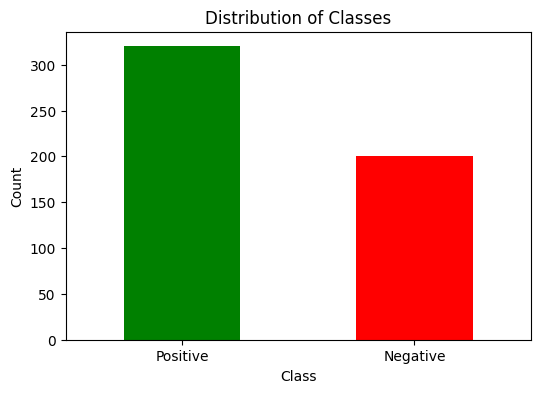

In [ ]:
# Visualize the dataset distribution

# Count the occurrences of each class
class_counts = data['class'].value_counts()

# Create a bar plot to visualize the distribution of classes
# Adjust the figure size
plt.figure(figsize=(6, 4))
# Assuming 'Positive' is green and 'Negative' is red
class_counts.plot(kind='bar', color=['green', 'red'])
plt.title('Distribution of Classes')
plt.xlabel('Class')
plt.ylabel('Count')
# Rotate x-axis labels
plt.xticks(rotation=0)
plt.show()

In [ ]:
class_counts = data['class'].value_counts()

# Print the counts
print(class_counts)

Positive    320
Negative    200
Name: class, dtype: int64


In [ ]:
# Visualize if dataset contains any null values
data.isna().sum()

Age                   0
Gender                0
Polyuria              0
Polydipsia            0
sudden weight loss    0
weakness              0
Polyphagia            0
Genital thrush        0
visual blurring       0
Itching               0
Irritability          0
delayed healing       0
partial paresis       0
muscle stiffness      0
Alopecia              0
Obesity               0
class                 0
dtype: int64

In [ ]:
# Separate features and target variable
X = data.drop('class', axis=1)
y = data[['class']]

In [ ]:
# Inspect feature values
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 520 entries, 0 to 519
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Age                 520 non-null    int64 
 1   Gender              520 non-null    object
 2   Polyuria            520 non-null    object
 3   Polydipsia          520 non-null    object
 4   sudden weight loss  520 non-null    object
 5   weakness            520 non-null    object
 6   Polyphagia          520 non-null    object
 7   Genital thrush      520 non-null    object
 8   visual blurring     520 non-null    object
 9   Itching             520 non-null    object
 10  Irritability        520 non-null    object
 11  delayed healing     520 non-null    object
 12  partial paresis     520 non-null    object
 13  muscle stiffness    520 non-null    object
 14  Alopecia            520 non-null    object
 15  Obesity             520 non-null    object
dtypes: int64(1), object(15)
me

In [ ]:
# Inspect target value
y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 520 entries, 0 to 519
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   class   520 non-null    object
dtypes: object(1)
memory usage: 4.2+ KB


In [ ]:
y

,class
0,Positive
1,Positive
2,Positive
3,Positive
4,Positive
...,...
515,Positive
516,Positive
517,Positive
518,Negative


In [ ]:
# List of columns to be label encoded (excluding 'Age') since 'Age' contains numeric values
columns_to_encode = [col for col in X.columns if col != 'Age']

# Label encode selected columns
label_encoder = LabelEncoder()
for column in columns_to_encode:
    X[column] = label_encoder.fit_transform(X[column])

In [ ]:
# Label encoding target variable
y = label_encoder.fit_transform(y)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


In [ ]:
# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
#1 MULTINOMIAL NAIVE BAYES

Accuracy: 0.91
Precision: 0.91
Recall: 0.91
F1-score: 0.91
Confusion Matrix:
[[28  5]
 [ 4 67]]


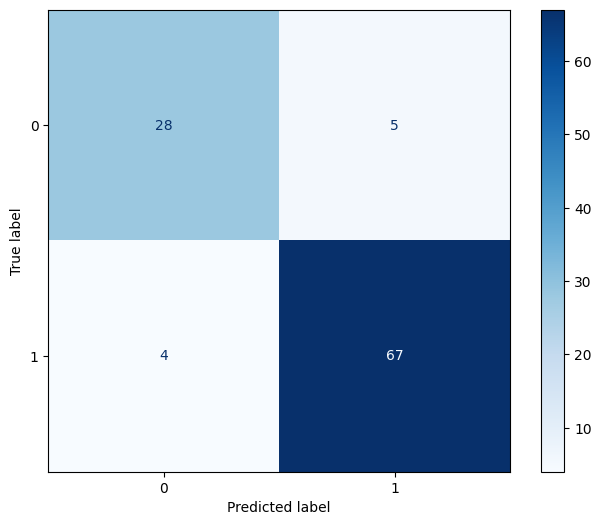

In [ ]:
# Create an instance of the classifier
mnb = MultinomialNB()

# Train the classifier
mnb.fit(X_train, y_train)

# Predict on the test set
y_pred = mnb.predict(X_test)


# Performance evaluation
# Calculate accuracy, precision, recall, F1-score
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-score: {f1:.2f}")

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)
from sklearn.metrics import ConfusionMatrixDisplay
#Confusion matrix plot
fig, ax = plt.subplots(figsize=(8, 6))
cmd = ConfusionMatrixDisplay(conf_matrix)
cmd.plot(ax=ax, cmap=plt.cm.Blues)
plt.show()

In [ ]:
#Explain a predicted instance for MNB via LIME
# Initialize LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                   feature_names=X_train.columns.tolist(),
                                                   class_names=['No Diabetes', 'Diabetes'],
                                                   mode='classification')

# Select an instance to explain (change the index as needed)
instance_to_explain = X_test.values[1]

# Explain the instance using LIME
exp = explainer.explain_instance(instance_to_explain, mnb.predict_proba, num_features=len(X_train.columns))
exp.show_in_notebook()  # Display the explanation in a Jupyter notebook

X does not have valid feature names, but MultinomialNB was fitted with feature names


PermutationExplainer explainer: 105it [00:22,  4.67it/s]


Sample number: 1
Actual class: 1
Predicted class: 1
Class 0 Possibility: 0.00
Class 1 Possibility: 1.00


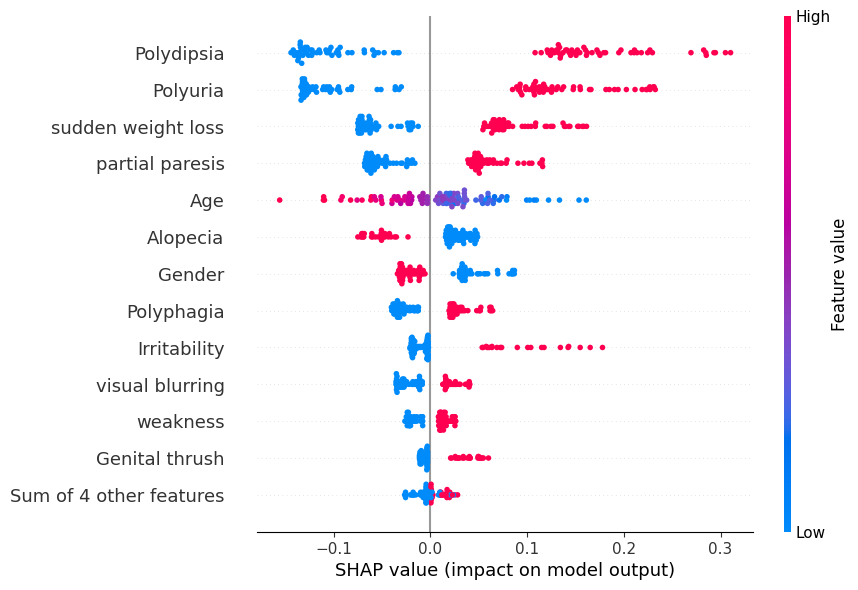

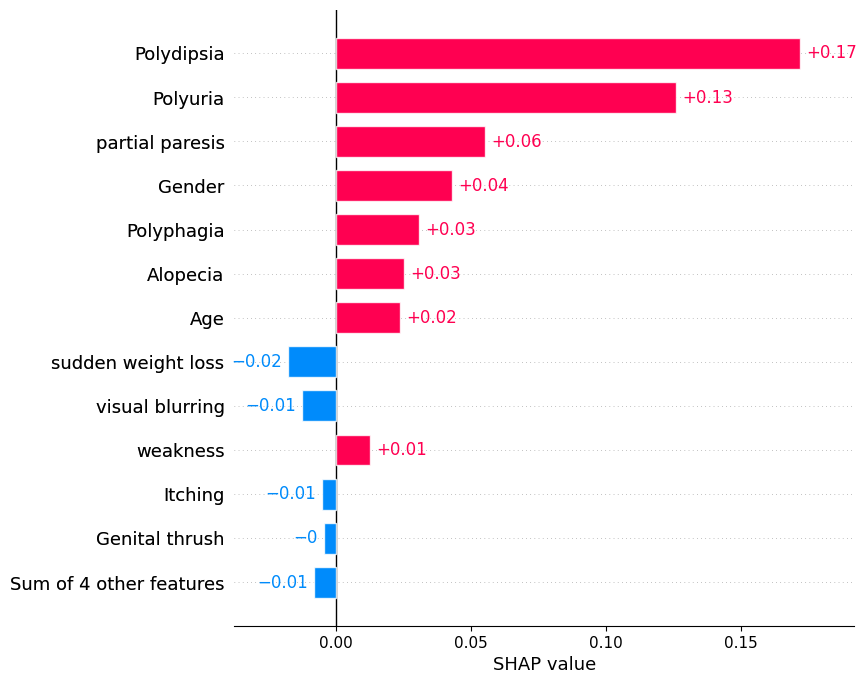

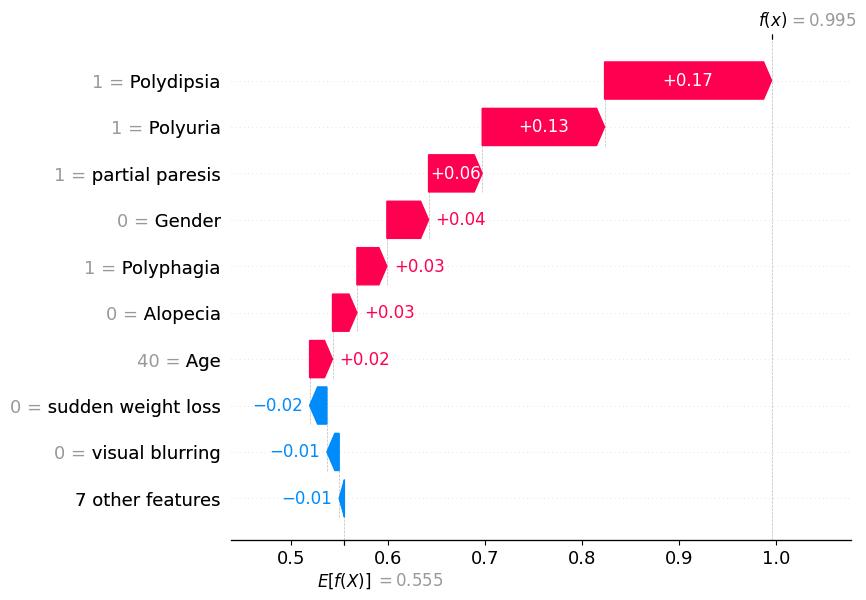

In [ ]:
# Explanation via SHAP for MNB

# Create a wrapper function for the predict method
model_predict = lambda x: mnb.predict_proba(x)[:, 1]  # Replace .predict_proba() with .predict() if using class labels

# Create the SHAP explainer and compute SHAP values
explainer = shap.Explainer(model_predict, X_train)
shap_values = explainer(X_test)

#PLOT

shap.initjs()
print(f"Sample number: {1}")

preds = mnb.predict(X_test)
probability = mnb.predict_proba(X_test)

print(f"Actual class: {y_test[1]}")
print(f"Predicted class: {preds[1]}")
print(f"Class 0 Possibility: {probability[1][0]:.2f}")
print(f"Class 1 Possibility: {probability[1][1]:.2f}")

# print(X_test.iloc[instance])      # to view the values of instance
# print(shap_values[instance])      # to view the shap scores

# SHAP Plots
shap.plots.beeswarm(shap_values, max_display=13)
shap.plots.bar(shap_values[1], max_display=13)
shap.plots.waterfall(shap_values[1])

In [ ]:
#2 RANDOM FOREST

Accuracy: 0.99
Precision: 0.99
Recall: 0.99
F1-score: 0.99
Confusion Matrix:
[[33  0]
 [ 1 70]]


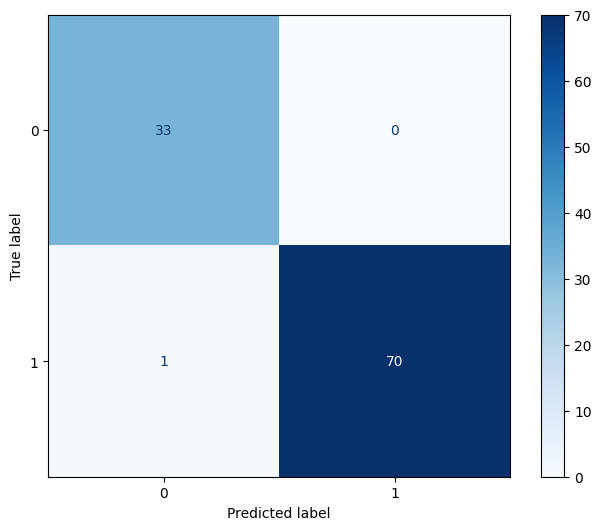

In [ ]:
# Importing required libraries
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()

# Train the classifier
rf.fit(X_train, y_train)

# Predict on the test set
y_pred = rf.predict(X_test)

# Performance evaluation
# Calculate accuracy, precision, recall, F1-score
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-score: {f1:.2f}")

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)


from sklearn.metrics import ConfusionMatrixDisplay
#Confusion matrix plot
fig, ax = plt.subplots(figsize=(8, 6))
cmd = ConfusionMatrixDisplay(conf_matrix)
cmd.plot(ax=ax, cmap=plt.cm.Blues)
plt.show()

In [ ]:
#Explain a predicted instance for RF via LIME
# Initialize LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                   feature_names=X_train.columns.tolist(),
                                                   class_names=['No Diabetes', 'Diabetes'],
                                                   mode='classification')

# Select an instance to explain (change the index as needed)
instance_to_explain = X_test.values[1]

# Explain the instance using LIME
exp = explainer.explain_instance(instance_to_explain, rf.predict_proba, num_features=len(X_train.columns))
exp.show_in_notebook()  # Display the explanation in a Jupyter notebook

X does not have valid feature names, but RandomForestClassifier was fitted with feature names


PermutationExplainer explainer: 105it [00:37,  2.05it/s]


Sample number: 1
Actual class: 1
Predicted class: 1
Class 0 Possibility: 0.01
Class 1 Possibility: 0.99


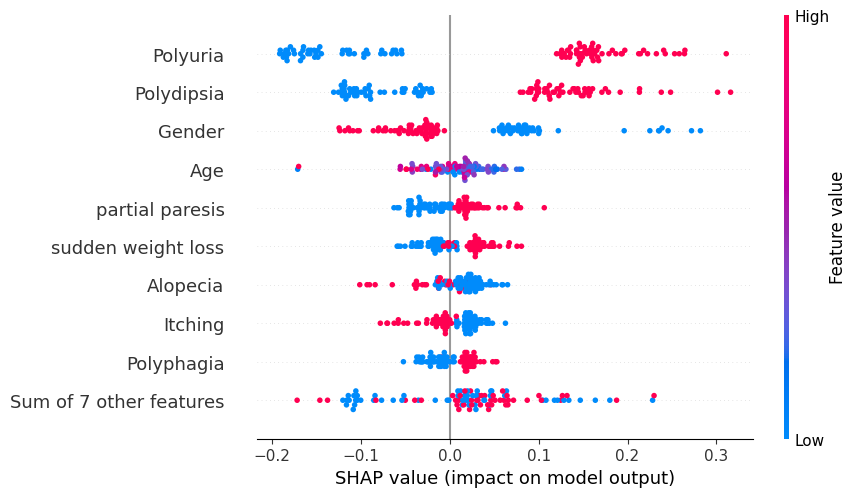

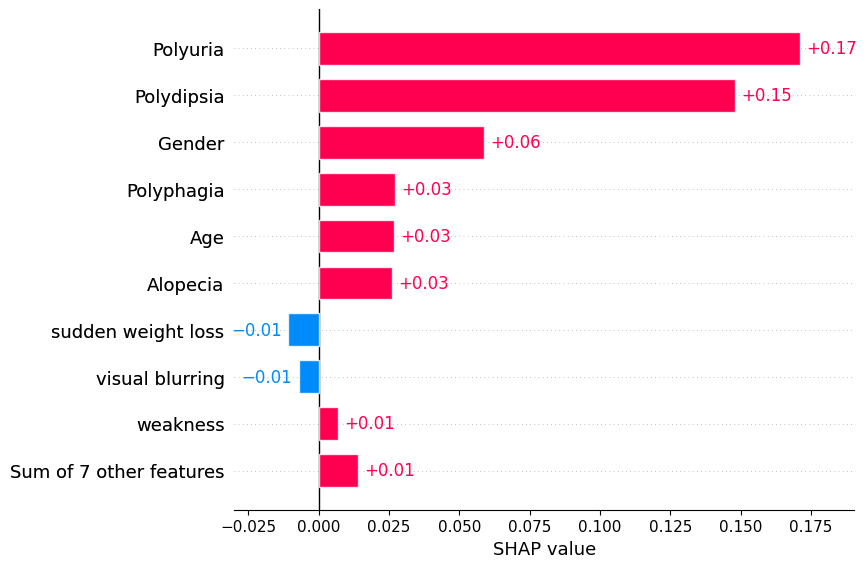

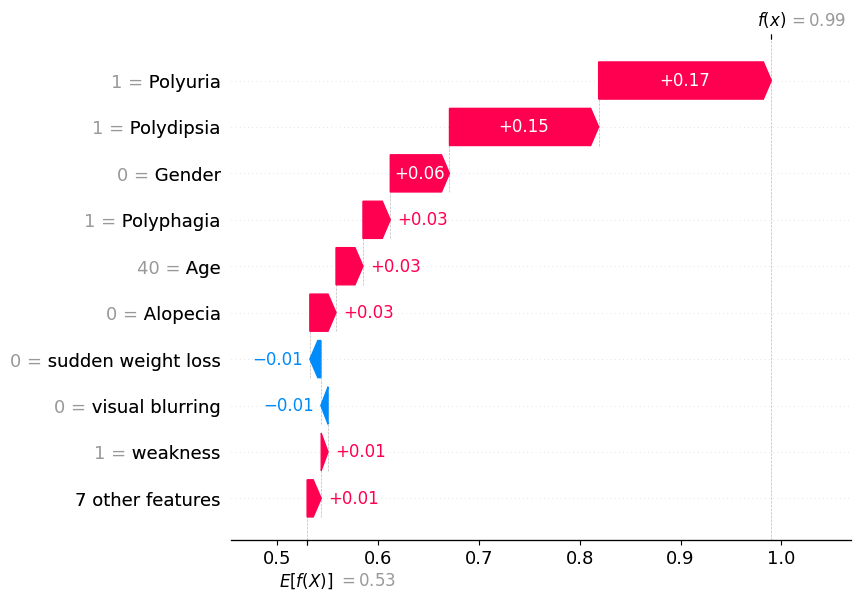

In [ ]:
#SHAP for RF

# Create a wrapper function for the predict method
model_predict = lambda x: rf.predict_proba(x)[:, 1]  # Replace .predict_proba() with .predict() if using class labels

# Create the SHAP explainer and compute SHAP values
explainer = shap.Explainer(model_predict, X_train)
shap_values = explainer(X_test)
shap.initjs()
print(f"Sample number: {1}")

preds = rf.predict(X_test)
probability = rf.predict_proba(X_test)

print(f"Actual class: {y_test[1]}")
print(f"Predicted class: {preds[1]}")
print(f"Class 0 Possibility: {probability[1][0]:.2f}")
print(f"Class 1 Possibility: {probability[1][1]:.2f}")

# print(X_test.iloc[instance])      # to view the values of instance
# print(shap_values[instance])      # to view the shap scores

# SHAP Plots
shap.plots.beeswarm(shap_values)
shap.plots.bar(shap_values[1])
shap.plots.waterfall(shap_values[1])

In [ ]:
#3 ADABOOST

`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.


Accuracy: 0.93
Precision: 0.93
Recall: 0.93
F1-score: 0.93
Confusion Matrix:
[[29  4]
 [ 3 68]]


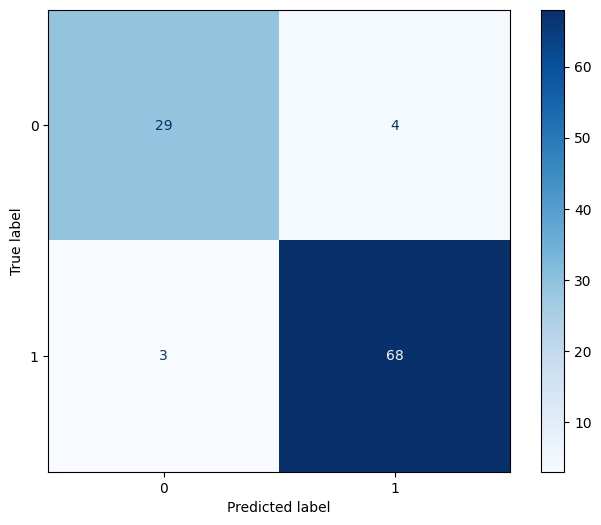

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier  # Importing a base learner (e.g., decision tree)
# Creating an instance of AdaBoost classifier with a decision tree base estimator
base_estimator = DecisionTreeClassifier(max_depth=1)
# Define a decision tree as the base estimator
adaboost_classifier = AdaBoostClassifier(base_estimator=base_estimator, n_estimators=50, random_state=42)

# Train the classifier
adaboost_classifier.fit(X_train, y_train)

# Predict on the test set
y_pred = adaboost_classifier.predict(X_test)
# Performance evaluation
# Calculate accuracy, precision, recall, F1-score
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-score: {f1:.2f}")

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

from sklearn.metrics import ConfusionMatrixDisplay
#Confusion matrix plot
fig, ax = plt.subplots(figsize=(8, 6))
cmd = ConfusionMatrixDisplay(conf_matrix)
cmd.plot(ax=ax, cmap=plt.cm.Blues)
plt.show()

In [ ]:
#Explain a predicted instance for Adaboost via LIME
# Initialize LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                   feature_names=X_train.columns.tolist(),
                                                   class_names=['No Diabetes', 'Diabetes'],
                                                   mode='classification')

# Select an instance to explain (change the index as needed)
instance_to_explain = X_test.values[1]

# Explain the instance using LIME
exp = explainer.explain_instance(instance_to_explain, adaboost_classifier.predict_proba, num_features=len(X_train.columns))
exp.show_in_notebook()  # Display the explanation in a Jupyter notebook

X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


PermutationExplainer explainer: 105it [00:48,  1.64it/s]


Sample number: 1
Actual class: 1
Predicted class: 1
Class 0 Possibility: 0.45
Class 1 Possibility: 0.55


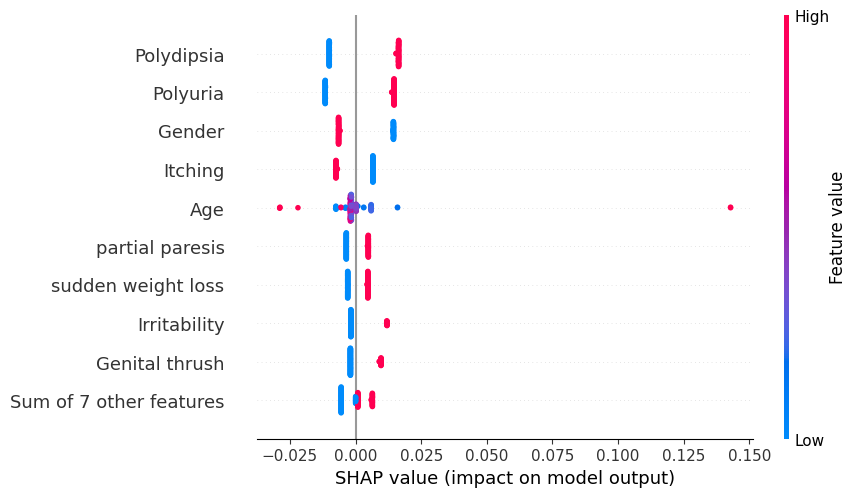

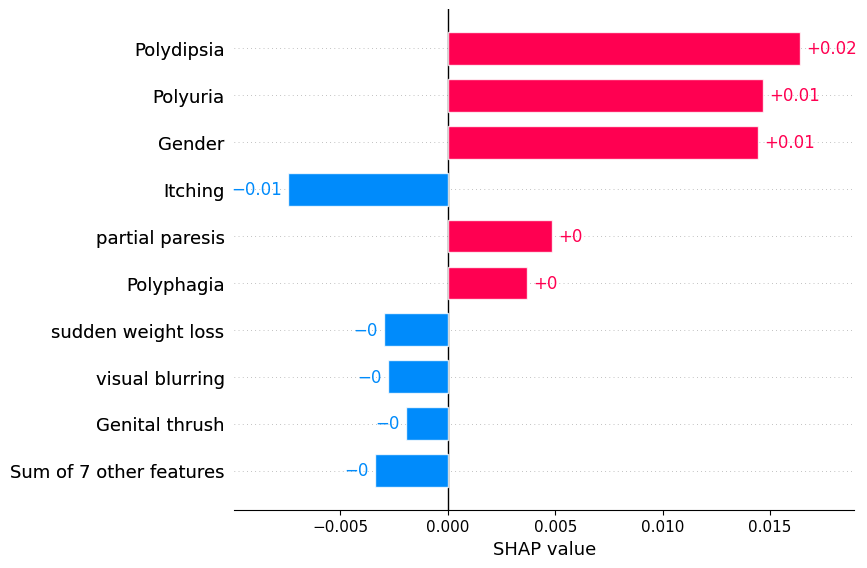

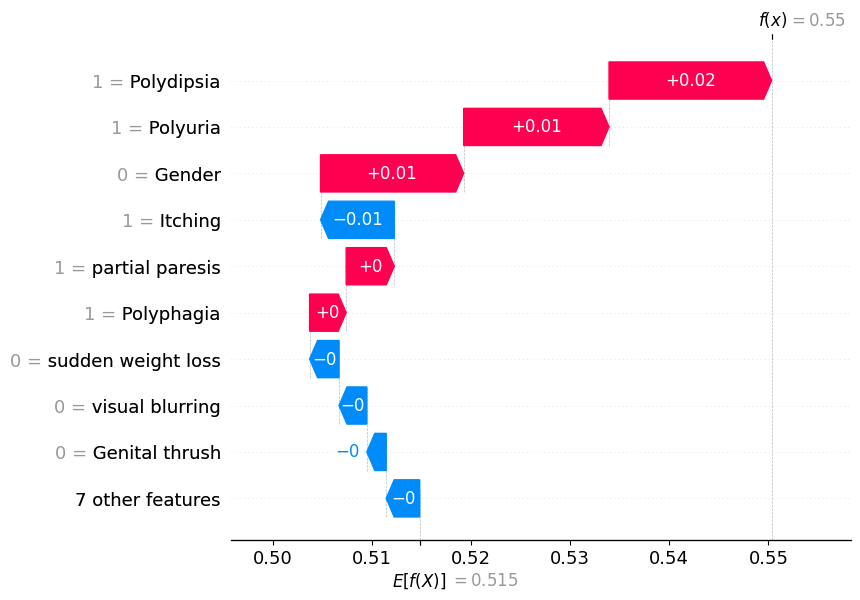

In [ ]:
#SHAP for Adaboost

# Create a wrapper function for the predict method
model_predict = lambda x: adaboost_classifier.predict_proba(x)[:, 1]  # Replace .predict_proba() with .predict() if using class labels

# Create the SHAP explainer and compute SHAP values
explainer = shap.Explainer(model_predict, X_train)
shap_values = explainer(X_test)
shap.initjs()
print(f"Sample number: {1}")

preds = adaboost_classifier.predict(X_test)
probability = adaboost_classifier.predict_proba(X_test)

print(f"Actual class: {y_test[1]}")
print(f"Predicted class: {preds[1]}")
print(f"Class 0 Possibility: {probability[1][0]:.2f}")
print(f"Class 1 Possibility: {probability[1][1]:.2f}")

# print(X_test.iloc[instance])      # to view the values of instance
# print(shap_values[instance])      # to view the shap scores

# SHAP Plots
shap.plots.beeswarm(shap_values)
shap.plots.bar(shap_values[1])
shap.plots.waterfall(shap_values[1])

In [ ]:
#4 GRADBOOST

Accuracy: 0.97
Precision: 0.97
Recall: 0.97
F1-score: 0.97
Confusion Matrix:
[[33  0]
 [ 3 68]]


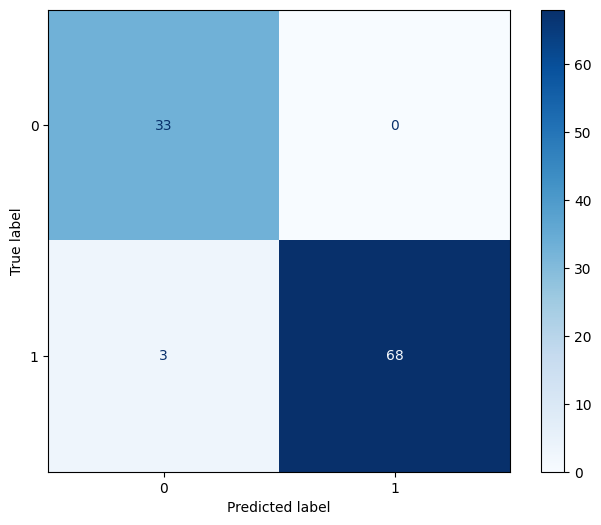

In [ ]:
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score

# Creating an instance of Gradient Boosting classifier
gradient_boosting_classifier = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
gradient_boosting_classifier.fit(X_train, y_train)

# Predict on the test set
y_pred = gradient_boosting_classifier.predict(X_test)


# Performance evaluation
# Calculate accuracy, precision, recall, F1-score
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-score: {f1:.2f}")

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

from sklearn.metrics import ConfusionMatrixDisplay
#Confusion matrix plot
fig, ax = plt.subplots(figsize=(8, 6))
cmd = ConfusionMatrixDisplay(conf_matrix)
cmd.plot(ax=ax, cmap=plt.cm.Blues)
plt.show()

In [ ]:
#Explain a predicted instance for Grad Boost via LIME
# Initialize LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                   feature_names=X_train.columns.tolist(),
                                                   class_names=['No Diabetes', 'Diabetes'],
                                                   mode='classification')

# Select an instance to explain (change the index as needed)
instance_to_explain = X_test.values[1]

# Explain the instance using LIME
exp = explainer.explain_instance(instance_to_explain, gradient_boosting_classifier.predict_proba, num_features=len(X_train.columns))
exp.show_in_notebook()  # Display the explanation in a Jupyter notebook

X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names


PermutationExplainer explainer: 105it [00:10,  1.53s/it]                         


Sample number: 1
Actual class: 1
Predicted class: 1
Class 0 Possibility: 0.00
Class 1 Possibility: 1.00


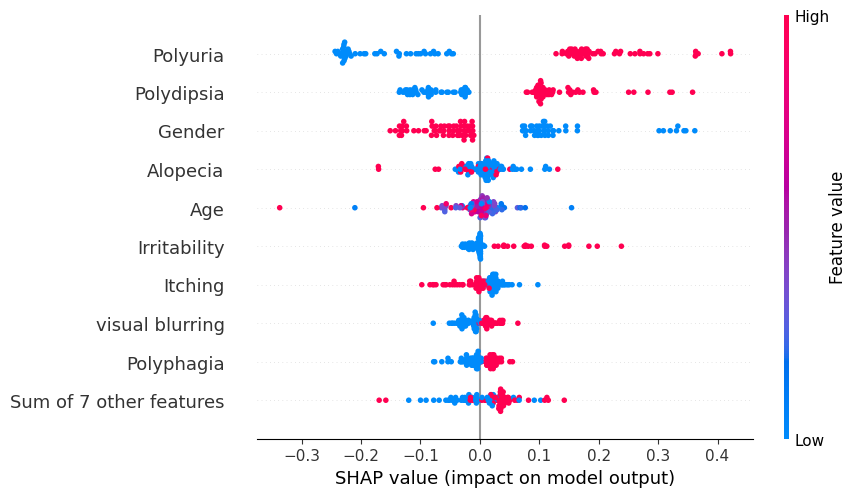

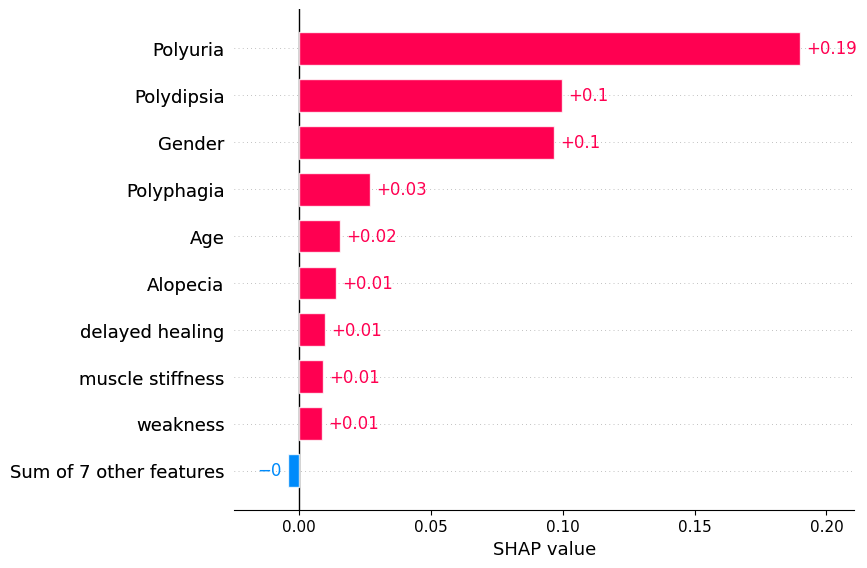

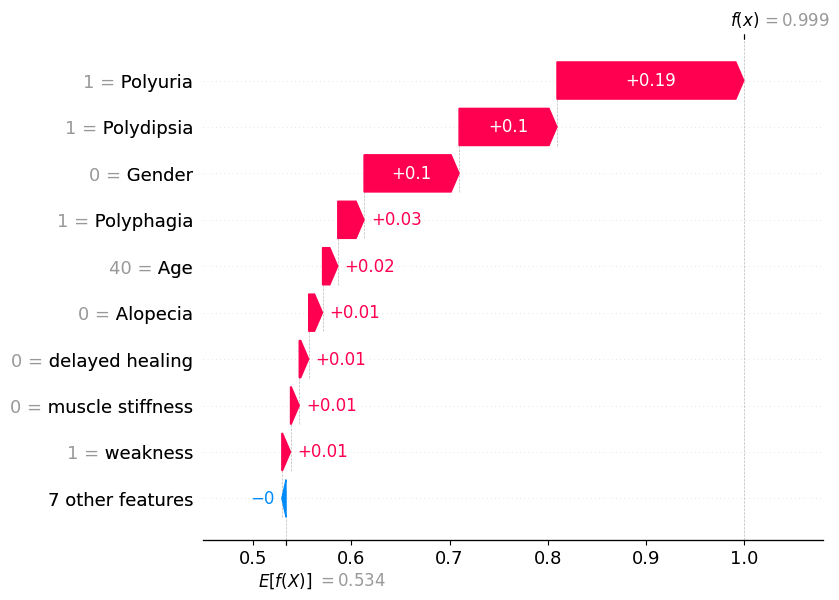

In [ ]:
#SHAP for GradBoost

# Create a wrapper function for the predict method
model_predict = lambda x: gradient_boosting_classifier.predict_proba(x)[:, 1]  # Replace .predict_proba() with .predict() if using class labels

# Create the SHAP explainer and compute SHAP values
explainer = shap.Explainer(model_predict, X_train)
shap_values = explainer(X_test)
shap.initjs()
print(f"Sample number: {1}")

preds = gradient_boosting_classifier.predict(X_test)
probability = gradient_boosting_classifier.predict_proba(X_test)

print(f"Actual class: {y_test[1]}")
print(f"Predicted class: {preds[1]}")
print(f"Class 0 Possibility: {probability[1][0]:.2f}")
print(f"Class 1 Possibility: {probability[1][1]:.2f}")

# print(X_test.iloc[instance])      # to view the values of instance
# print(shap_values[instance])      # to view the shap scores

# SHAP Plots
shap.plots.beeswarm(shap_values)
shap.plots.bar(shap_values[1])
shap.plots.waterfall(shap_values[1])

In [ ]:
#5 KNN

Accuracy: 0.90
Precision: 0.91
Recall: 0.90
F1-score: 0.91
Confusion Matrix:
[[30  3]
 [ 7 64]]


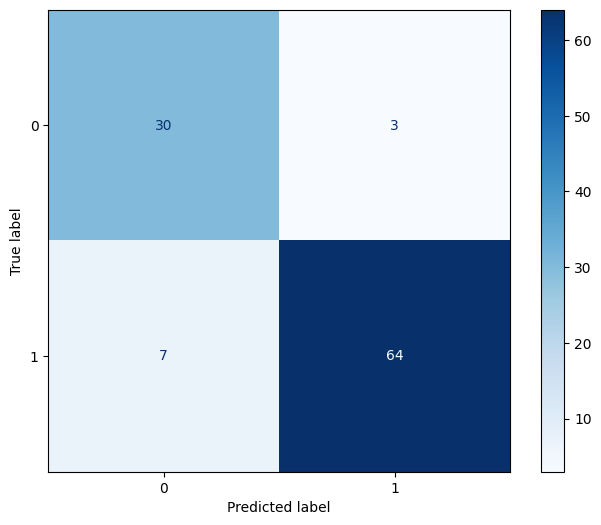

In [ ]:
# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the features using the scaler
X_scaled = scaler.fit_transform(X)


# Convert the scaled features back to a DataFrame
X_scaled = pd.DataFrame(X_scaled, columns=X.columns)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)



from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors = 5)
# Train the classifier
knn.fit(X_train, y_train)

# Predict on the test set
y_pred = knn.predict(X_test)


# Performance evaluation
# Calculate accuracy, precision, recall, F1-score
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-score: {f1:.2f}")

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

from sklearn.metrics import ConfusionMatrixDisplay
#Confusion matrix plot
fig, ax = plt.subplots(figsize=(8, 6))
cmd = ConfusionMatrixDisplay(conf_matrix)
cmd.plot(ax=ax, cmap=plt.cm.Blues)
plt.show()

In [ ]:
#Explain a predicted instance for KNN via LIME
# Initialize LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                   feature_names=X_train.columns.tolist(),
                                                   class_names=['No Diabetes', 'Diabetes'],
                                                   mode='classification')

# Select an instance to explain (change the index as needed)
instance_to_explain = X_test.values[1]

# Explain the instance using LIME
exp = explainer.explain_instance(instance_to_explain, knn.predict_proba, num_features=len(X_train.columns))
exp.show_in_notebook()  # Display the explanation in a Jupyter notebook

X does not have valid feature names, but KNeighborsClassifier was fitted with feature names


PermutationExplainer explainer: 105it [00:39,  1.89it/s]


Sample number: 1
Actual class: 1
Predicted class: 1
Class 0 Possibility: 0.00
Class 1 Possibility: 1.00


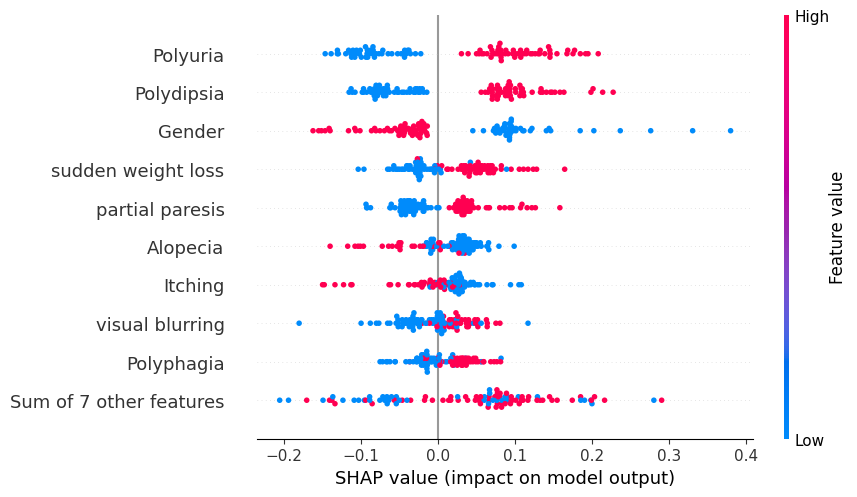

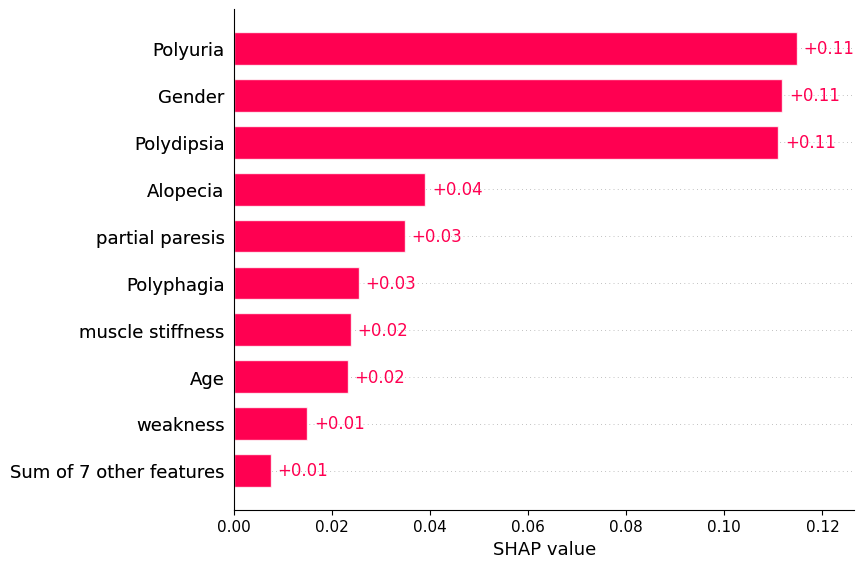

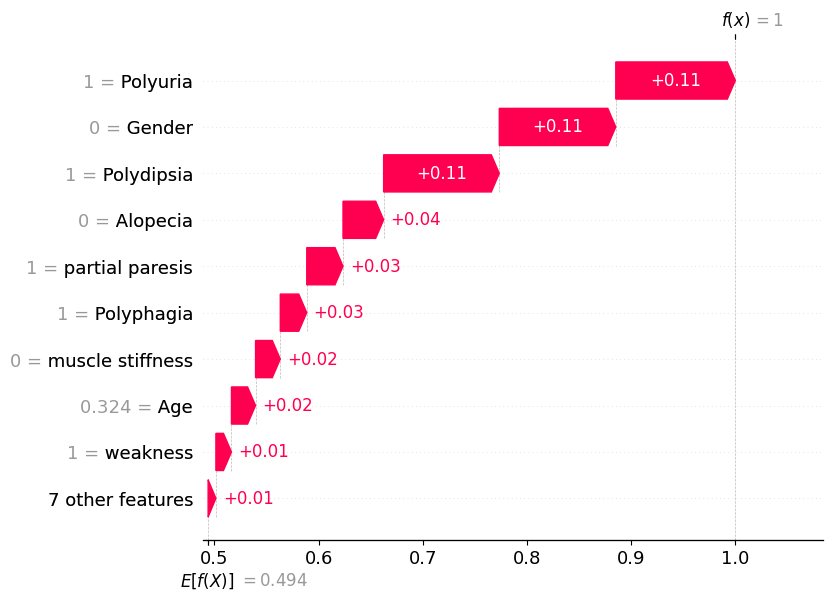

In [ ]:
#SHAP for KNN

# Create a wrapper function for the predict method
model_predict = lambda x: knn.predict_proba(x)[:, 1]  # Replace .predict_proba() with .predict() if using class labels

# Create the SHAP explainer and compute SHAP values
explainer = shap.Explainer(model_predict, X_train)
shap_values = explainer(X_test)
shap.initjs()
print(f"Sample number: {1}")

preds = knn.predict(X_test)
probability = knn.predict_proba(X_test)

print(f"Actual class: {y_test[1]}")
print(f"Predicted class: {preds[1]}")
print(f"Class 0 Possibility: {probability[1][0]:.2f}")
print(f"Class 1 Possibility: {probability[1][1]:.2f}")

# print(X_test.iloc[instance])      # to view the values of instance
# print(shap_values[instance])      # to view the shap scores

# SHAP Plots
shap.plots.beeswarm(shap_values)
shap.plots.bar(shap_values[1])
shap.plots.waterfall(shap_values[1])